In [39]:

import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import sys
from google.colab.patches import cv2_imshow
plt.style.use("ggplot")
%matplotlib inline

from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from tensorflow.keras.layers import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
from keras_preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

# **Problem** **1**


Display training data

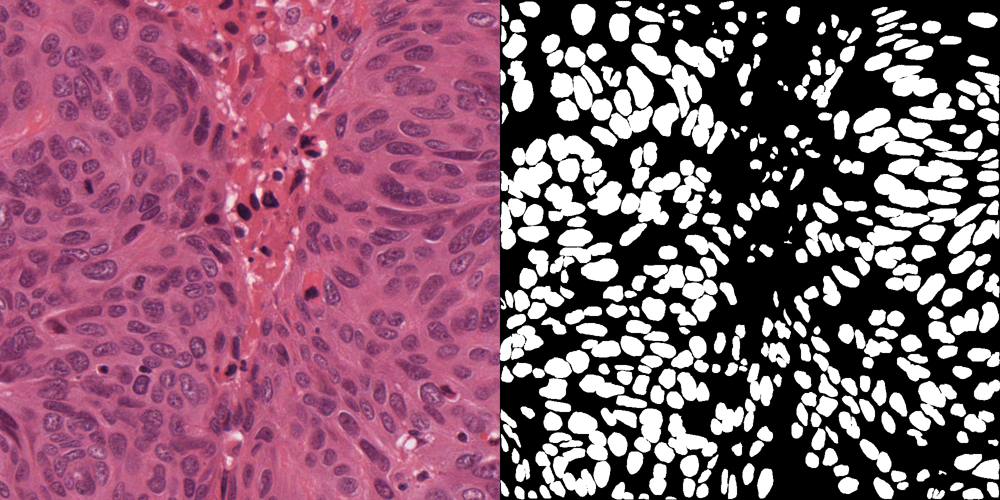

In [40]:
tissue=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data/Tissue-Images/TCGA-18-5592-01Z-00-DX1.png")
binary=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data/Binary-Mask/TCGA-18-5592-01Z-00-DX1.png")
disp=np.concatenate((tissue,binary),axis=1)
cv2_imshow(disp)

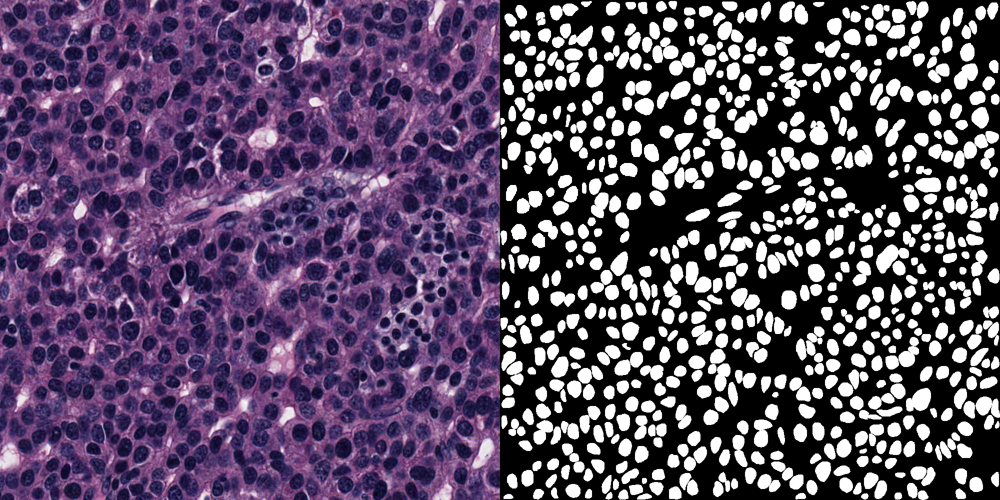

In [41]:
tissue=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data/Tissue-Images/TCGA-21-5784-01Z-00-DX1.png")
binary=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data/Binary-Mask/TCGA-21-5784-01Z-00-DX1.png")
disp=np.concatenate((tissue,binary),axis=1)
cv2_imshow(disp)

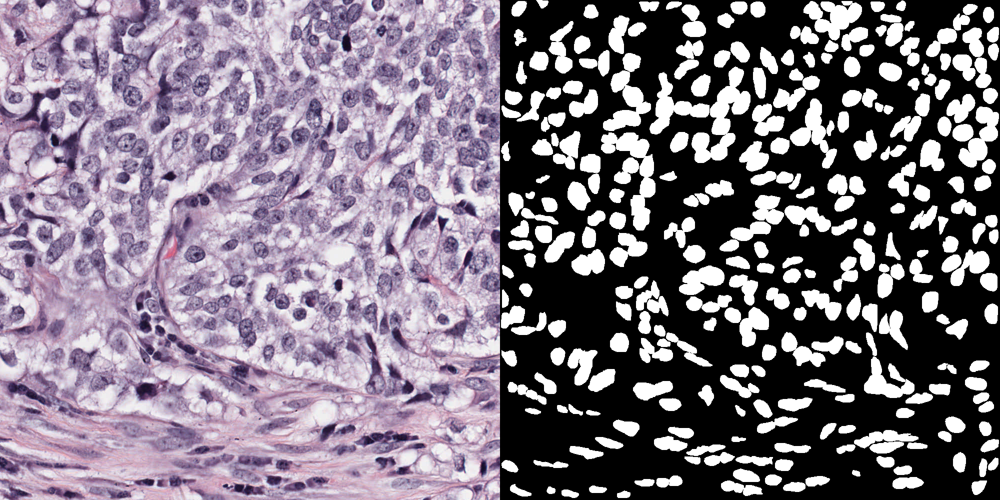

In [42]:
tissue=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data/Tissue-Images/TCGA-21-5786-01Z-00-DX1.png")
binary=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data/Binary-Mask/TCGA-21-5786-01Z-00-DX1.png")
disp=np.concatenate((tissue,binary),axis=1)
cv2_imshow(disp)

Display test data

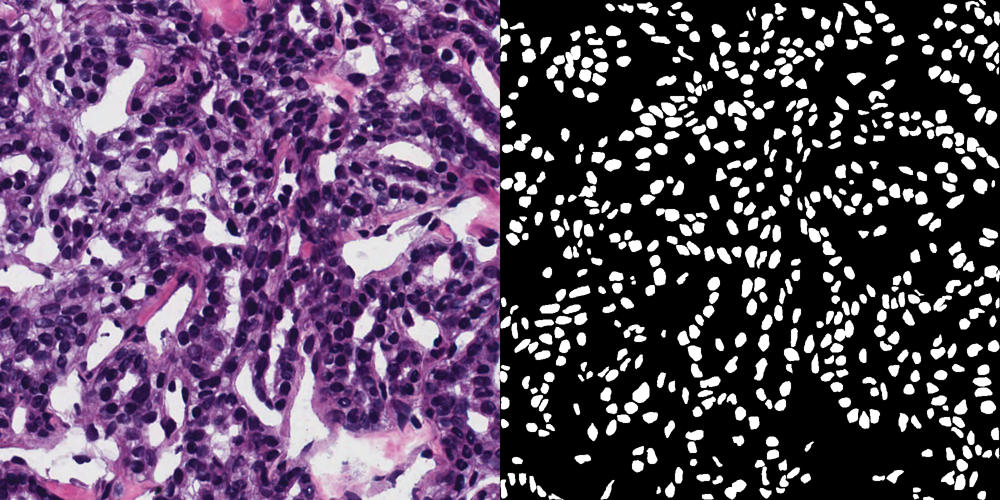

In [43]:
tissue=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Test-Data/Tissue-Images/TCGA-2Z-A9J9-01A-01-TS1.png")
binary=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Test-Data/Binary-Mask/TCGA-2Z-A9J9-01A-01-TS1.png")
disp=np.concatenate((tissue,binary),axis=1)
cv2_imshow(disp)

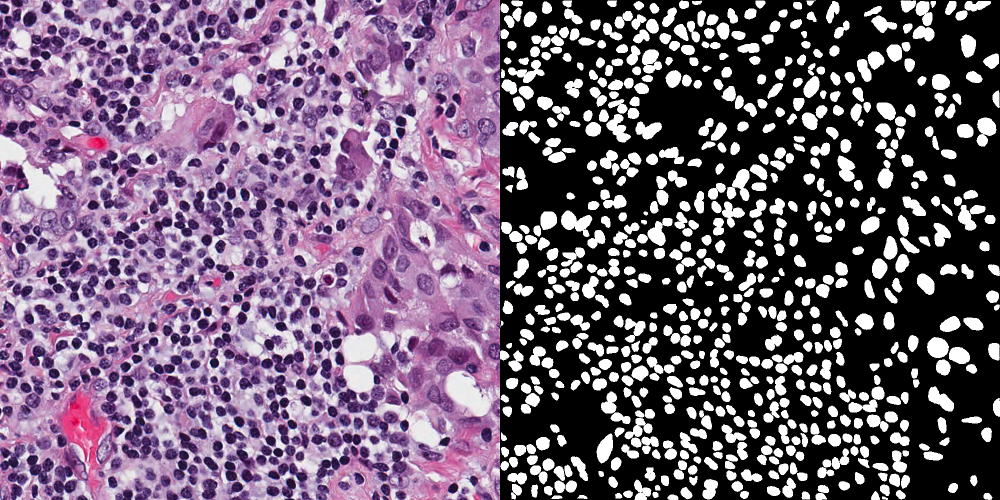

In [44]:
tissue=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Test-Data/Tissue-Images/TCGA-44-2665-01B-06-BS6.png")
binary=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Test-Data/Binary-Mask/TCGA-44-2665-01B-06-BS6.png")
disp=np.concatenate((tissue,binary),axis=1)
cv2_imshow(disp)

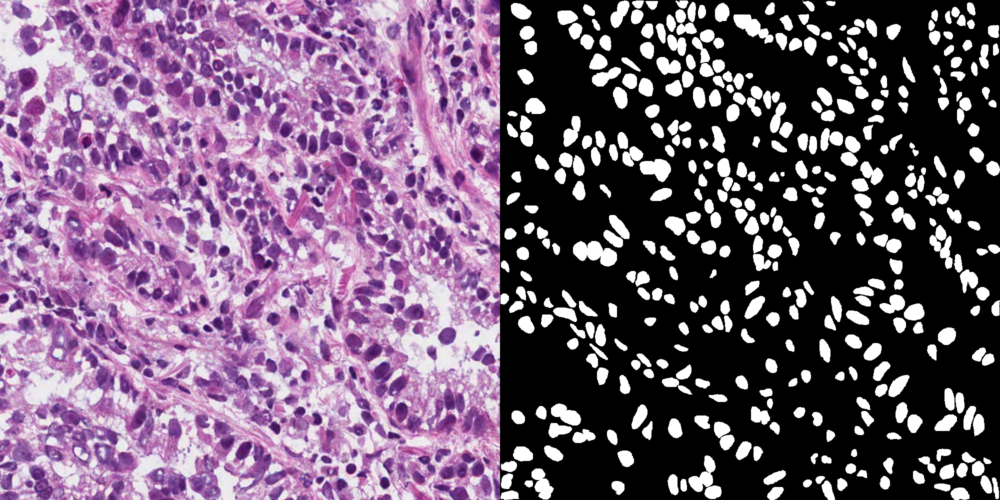

In [45]:
binary=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Test-Data/Binary-Mask/TCGA-69-7764-01A-01-TS1.png")
tissue=cv2.imread("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Test-Data/Tissue-Images/TCGA-69-7764-01A-01-TS1.png")
disp=np.concatenate((tissue,binary),axis=1)
cv2_imshow(disp)

# **Problem** **2**


In [46]:
# Set some parameters
im_width = 128
im_height = 128
border = 5
im_chan = 2 # Number of channels: first is original and second cumsum(axis=0)
n_features = 1 # Number of extra features, like depth

In [56]:
ids = next(os.walk("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data/Tissue-Images"))[2] # list of names all images in the given path
print("No. of images = ", len(ids))

No. of images =  60


In [57]:
X = np.zeros((len(ids), im_height, im_width, 1), dtype=np.float32)
y = np.zeros((len(ids), im_height, im_width, 1), dtype=np.float32)

In [58]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

In [47]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x

In [48]:
def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)
    
    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)
    
    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)
    
    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    
    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    
    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    
    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    
    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model


In [49]:
input_img = Input((im_height, im_width, 1), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)
model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])

In [50]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_20 (Conv2D)             (None, 128, 128, 16  160         ['img[0][0]']                    
                                )                                                                 
                                                                                                  
 batch_normalization_19 (BatchN  (None, 128, 128, 16  64         ['conv2d_20[0][0]']              
 ormalization)                  )                                                           

In [61]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('my_model_weights.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [62]:
results = model.fit(X_train, y_train, batch_size=32, epochs=50, callbacks=callbacks,\
                    validation_data=(X_valid, y_valid))

Epoch 1/50
2/2 [==============================] - ETA: 0s - loss: 0.6446 - accuracy: 1.0000
Epoch 1: val_loss improved from inf to 0.64388, saving model to my_model_weights.h5
2/2 [==============================] - 7s 3s/step - loss: 0.6446 - accuracy: 1.0000 - val_loss: 0.6439 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 2/50
2/2 [==============================] - ETA: 0s - loss: 0.6437 - accuracy: 1.0000
Epoch 2: val_loss improved from 0.64388 to 0.64295, saving model to my_model_weights.h5
2/2 [==============================] - 7s 3s/step - loss: 0.6437 - accuracy: 1.0000 - val_loss: 0.6429 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 3/50
2/2 [==============================] - ETA: 0s - loss: 0.6428 - accuracy: 1.0000
Epoch 3: val_loss improved from 0.64295 to 0.64202, saving model to my_model_weights.h5
2/2 [==============================] - 7s 3s/step - loss: 0.6428 - accuracy: 1.0000 - val_loss: 0.6420 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 4/50
2/2 [==============================]

In [63]:
model.save('/content/drive/MyDrive/EE 610/Assignment4')
model.save_weights('/content/drive/MyDrive/EE 610/Assignment4/my_model_weights.h5')


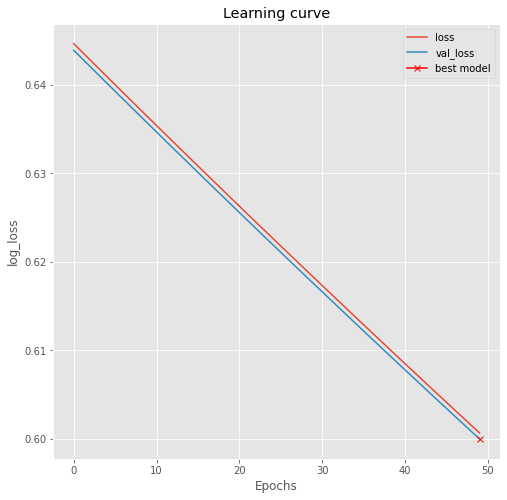

In [64]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

# **Problem** **3**


In [65]:
k=3

# segmentation
seg = np.zeros((100,100), dtype='int')
seg[30:70, 30:70] = k

# ground truth
gt = np.zeros((100,100), dtype='int')
gt[30:70, 40:80] = k

dice = np.sum(seg[gt==k])*2.0 / (np.sum(seg) + np.sum(gt))

print ('Dice similarity score is {}'.format(dice))

Dice similarity score is 0.75


In [66]:
train_ids = next(os.walk("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data"))
test_ids = next(os.walk("/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Test-Data"))

In [67]:
path_train='/content/drive/MyDrive/EE 610/Assignment4/MoNuSeg-Training-Data'

Test data

In [68]:
model.load_weights('/content/drive/MyDrive/EE 610/Assignment4/my_model_weights.h5')

In [69]:
model.evaluate(X_valid, y_valid, verbose=1)

1/1 [==============================] - 0s 192ms/step - loss: 0.6000 - accuracy: 1.0000


[0.600005567073822, 1.0]

In [70]:
# Predict on train, val and test
preds_train = model.predict(X_train, verbose=1)
preds_val = model.predict(X_valid, verbose=1)

1/1 [==============================] - 0s 191ms/step


In [71]:
# Threshold predictions
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

In [75]:
def plot_sample(X, y, preds, binary_preds, ix=None):
    """Function to plot the results"""
    if ix is None:
        ix = random.randint(0, len(X))

    has_mask = y[ix].max() > 0

    fig, ax = plt.subplots(1, 4, figsize=(20, 10))
    ax[0].imshow(X[ix, ..., 0], cmap='seismic')
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='k', levels=[0.5])
    

    ax[1].imshow(y[ix].squeeze())
    

    ax[2].imshow(preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='k', levels=[0.5])
    
    
    ax[3].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='k', levels=[0.5]);

# **Problem** **4**


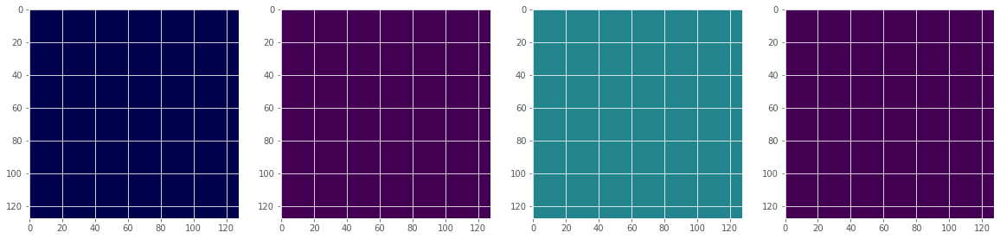

In [77]:
plot_sample(X_train, y_train, preds_train, preds_train_t)


# **Problem** **5**


# **Problem** **6**


**References:**


*   https://www.kaggle.com/code/bguberfain/unet-with-depth/
*   https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5

